# 2.3: Complex Machine Learning Models and Keras Part 2

## Table of Content

[01. Import libraries](#01.-Import-libraries)

[02. Import Data](#02.-Import-Data)

[03. Preparing Data](#03.-Preparing-Data)

## 01. Import libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from numpy import argmax

In [2]:
# Set option to ensure charts are displayed inline in the notebook

%matplotlib inline

In [3]:
# Set option to display max number of columns

pd.set_option('display.max_columns', None)

## 02. Import Data

In [4]:
df = pd.read_csv((r'E:\Careerfoundry course\Careerfoundry Course Old\Machine Learning with Python\Gnerated Data\Climate_cleaned.csv'),index_col = False)

In [5]:
df_Weather = pd.read_csv((r'E:\Careerfoundry course\Careerfoundry Course Old\Machine Learning with Python\Raw Data\Weather.csv'),index_col = False)

In [6]:
df.head(1)

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max,HEATHROW_cloud_cover,HEATHROW_humidity,HEATHROW_pressure,HEATHROW_global_radiation,HEATHROW_precipitation,HEATHROW_sunshine,HEATHROW_temp_mean,HEATHROW_temp_min,HEATHROW_temp_max,KASSEL_cloud_cover,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_pressure,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max,OSLO_cloud_cover,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max,SONNBLICK_cloud_cover,SONNBLICK_humidity,SONNBLICK_pressure,SONNBLICK_global_radiation,SONNBLICK_precipitation,SONNBLICK_sunshine,SONNBLICK_temp_mean,SONNBLICK_temp_min,SONNBLICK_temp_max,STOCKHOLM_cloud_cover,STOCKHOLM_humidity,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,1,0.81,1.0195,0.88,0.0,7.0,3.7,-0.9,7.9,4,0.67,1.017,0.44,0.01,2.3,2.4,-0.4,5.1,7,0.85,1.0032,0.07,0.25,0.0,9.3,7.4,11.0,8,0.83,1.0161,0.12,0.08,0.0,10.0,7.0,11.5,7,0.91,1.001,0.13,0.22,0.0,10.6,9.4,8.3,8,0.82,1.0094,0.28,0.48,1.6,7.9,3.9,9.4,8,1.0,1.0173,0.2,0.0,0.0,-0.6,-1.9,0.5,7,0.83,1.0063,0.22,0.32,1.0,9.5,8.5,11.1,6,0.92,1.026,0.53,0.0,1.4,7.6,4.4,10.8,5,0.67,1.018,0.2,0.1,0.0,6.9,1.1,10.4,8,0.98,0.9978,0.04,1.14,0.0,4.9,3.8,5.9,4,0.73,1.0304,0.48,0.01,2.3,-5.9,-8.5,-3.2,5,0.98,1.0114,0.05,0.32,0.0,4.2,2.2,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9


In [7]:
df.shape

(22950, 135)

In [8]:
df_Weather.head(1)

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [9]:
df_Weather.shape

(22950, 16)

In [10]:
#Read in the European weather data.
climate = pd.read_csv((r'E:\Careerfoundry course\Careerfoundry Course Old\Machine Learning with Python\Raw Data\ClimateWins.csv'),index_col = False)
climate.head(1)

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max,DEBILT_cloud_cover,DEBILT_wind_speed,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max,DUSSELDORF_cloud_cover,DUSSELDORF_wind_speed,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_snow_depth,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max,GDANSK_cloud_cover,GDANSK_humidity,GDANSK_precipitation,GDANSK_snow_depth,GDANSK_temp_mean,GDANSK_temp_min,GDANSK_temp_max,HEATHROW_cloud_cover,HEATHROW_humidity,HEATHROW_pressure,HEATHROW_global_radiation,HEATHROW_precipitation,HEATHROW_snow_depth,HEATHROW_sunshine,HEATHROW_temp_mean,HEATHROW_temp_min,HEATHROW_temp_max,KASSEL_wind_speed,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max,LJUBLJANA_cloud_cover,LJUBLJANA_wind_speed,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max,MAASTRICHT_cloud_cover,MAASTRICHT_wind_speed,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_snow_depth,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max,OSLO_cloud_cover,OSLO_wind_speed,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_snow_depth,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max,ROMA_cloud_cover,ROMA_wind_speed,ROMA_humidity,ROMA_pressure,ROMA_sunshine,ROMA_temp_mean,SONNBLICK_cloud_cover,SONNBLICK_wind_speed,SONNBLICK_humidity,SONNBLICK_pressure,SONNBLICK_global_radiation,SONNBLICK_precipitation,SONNBLICK_sunshine,SONNBLICK_temp_mean,SONNBLICK_temp_min,SONNBLICK_temp_max,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max,TOURS_wind_speed,TOURS_humidity,TOURS_pressure,TOURS_global_radiation,TOURS_precipitation,TOURS_temp_mean,TOURS_temp_min,TOURS_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.1,0.85,1.018,0.32,0.09,0,0.7,6.5,0.8,10.9,1,0.81,1.0195,0.88,0.0,7.0,3.7,-0.9,7.9,4,0.67,1.017,0.44,0.01,2.3,2.4,-0.4,5.1,7,7.7,0.85,1.0032,0.07,0.25,0.0,9.3,7.4,11.0,8,5.4,0.83,1.0161,0.12,0.08,0,0.0,10.0,7.0,11.5,8,0.91,0.0,0,0.8,-0.3,1.6,7,0.91,1.001,0.13,0.22,0,0.0,10.6,9.4,8.3,2.9,0.82,1.0094,0.28,0.48,1.6,7.9,3.9,9.4,8,1.4,1.0,1.0173,0.2,0.0,0.0,-0.6,-1.9,0.5,7,8.7,0.83,1.0063,0.22,0.32,1.0,9.5,8.5,11.1,6,0.0,0.92,1.026,0.53,0.0,1.4,7.6,4.4,10.8,5,0.67,0.2,0.1,0,0.0,6.9,1.1,10.4,8,4.0,0.98,0.9978,0.04,1.14,0,0.0,4.9,3.8,5.9,3,2.6,0.73,1.0152,7.1,7.8,4,4.5,0.73,1.0304,0.48,0.01,2.3,-5.9,-8.5,-3.2,5,1.0114,0.05,0.32,0.0,4.2,2.2,4.9,3.8,0.76,1.0169,1.54,0.44,10.0,7.8,12.2,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9


## 03. Preparing Data

In [11]:
#Combine date and cleaned data
climate_date = pd.concat([climate['DATE'],df], axis=1)
climate_date

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max,HEATHROW_cloud_cover,HEATHROW_humidity,HEATHROW_pressure,HEATHROW_global_radiation,HEATHROW_precipitation,HEATHROW_sunshine,HEATHROW_temp_mean,HEATHROW_temp_min,HEATHROW_temp_max,KASSEL_cloud_cover,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_pressure,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max,OSLO_cloud_cover,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max,SONNBLICK_cloud_cover,SONNBLICK_humidity,SONNBLICK_pressure,SONNBLICK_global_radiation,SONNBLICK_precipitation,SONNBLICK_sunshine,SONNBLICK_temp_mean,SONNBLICK_temp_min,SONNBLICK_temp_max,STOCKHOLM_cloud_cover,STOCKHOLM_humidity,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,7,0.85,1.0180,0.32,0.09,0.7,6.5,0.8,10.9,1,0.81,1.0195,0.88,0.00,7.0,3.7,-0.9,7.9,4,0.67,1.017,0.44,0.01,2.3,2.4,-0.4,5.1,7,0.85,1.0032,0.07,0.25,0.0,9.3,7.4,11.0,8,0.83,1.0161,0.12,0.08,0.0,10.0,7.0,11.5,7,0.91,1.0010,0.13,0.22,0.0,10.6,9.4,8.3,8,0.82,1.0094,0.28,0.48,1.6,7.9,3.9,9.4,8,1.00,1.0173,0.20,0.00,0.0,-0.6,-1.9,0.5,7,0.83,1.0063,0.22,0.32,1.0,9.5,8.5,11.1,6,0.92,1.0260,0.53,0.00,1.4,7.6,4.4,10.8,5,0.67,1.0180,0.20,0.10,0.0,6.9,1.1,10.4,8,0.98,0.9978,0.04,1.14,0.0,4.9,3.8,5.9,4,0.73,1.0304,0.48,0.01,2.3,-5.9,-8.5,-3.2,5,0.98,1.0114,0.05,0.32,0.0,4.2,2.2,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,19600102,6,0.84,1.0180,0.36,1.05,1.1,6.1,3.3,10.1,6,0.84,1.0172,0.25,0.00,0.0,2.9,2.2,4.4,4,0.67,1.017,0.18,0.31,0.0,2.3,1.4,3.1,8,0.90,1.0056,0.14,0.06,0.1,7.7,6.4,8.3,8,0.89,1.0161,0.18,0.66,0.5,8.2,7.4,11.0,7,0.98,1.0051,0.13,0.23,0.0,6.1,3.9,10.6,8,0.86,1.0086,0.12,0.27,0.0,7.7,6.8,9.1,6,0.94,1.0173,0.56,0.13,3.2,2.1,-1.3,5.5,8,0.92,1.0062,0.17,1.34,0.4,8.6,7.5,9.9,7,0.86,1.0254,0.46,0.00,0.9,9.8,7.4,12.2,6,0.72,1.0180,0.61,0.30,5.1,6.2,4.2,10.2,8,0.62,1.0139,0.04,0.00,0.0,3.4,2.8,4.9,6,0.97,1.0292,0.21,0.61,0.0,-9.5,-10.5,-8.5,5,0.62,1.0114,0.05,0.06,0.0,4.0,3.0,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,19600103,8,0.90,1.0180,0.18,0.30,0.0,8.5,5.1,9.9,6,0.77,1.0179,0.67,0.00,3.5,3.1,-0.5,6.4,4,0.67,1.017,0.30,0.00,0

In [12]:
#Reduce dataset to a single year
dfyear = climate_date.loc[climate_date['DATE'].astype(str).str[:4].isin(['2020','2019','2018','2017','2016','2015','2014','2013','2012','2011'])] #<-----INSERT YEAR HERE
dfyear

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max,HEATHROW_cloud_cover,HEATHROW_humidity,HEATHROW_pressure,HEATHROW_global_radiation,HEATHROW_precipitation,HEATHROW_sunshine,HEATHROW_temp_mean,HEATHROW_temp_min,HEATHROW_temp_max,KASSEL_cloud_cover,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_pressure,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max,OSLO_cloud_cover,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max,SONNBLICK_cloud_cover,SONNBLICK_humidity,SONNBLICK_pressure,SONNBLICK_global_radiation,SONNBLICK_precipitation,SONNBLICK_sunshine,SONNBLICK_temp_mean,SONNBLICK_temp_min,SONNBLICK_temp_max,STOCKHOLM_cloud_cover,STOCKHOLM_humidity,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
18628,20110101,8,0.97,1.0232,0.13,0.00,0.0,-0.2,-0.8,0.3,4,0.92,1.0227,0.64,0.00,3.1,-5.5,-8.6,-2.3,4,0.67,1.017,0.38,0.00,1.4,-1.7,-4.8,0.1,6,0.93,1.0211,0.22,0.06,1.2,3.5,-0.3,5.9,6,0.95,1.0212,0.12,0.07,0.0,1.3,-4.1,2.9,8,0.86,1.0250,0.13,0.06,0.0,5.9,4.6,4.0,6,0.93,1.0194,0.17,0.20,0.2,0.2,-2.4,2.4,3,0.98,1.0200,0.43,0.00,3.5,-4.2,-7.5,-1.3,7,0.99,1.0222,0.12,0.06,0.0,1.4,-0.3,2.4,6,0.87,1.0206,0.79,0.00,3.8,8.2,5.2,11.3,8,0.93,1.0232,0.20,0.07,0.0,-0.7,-1.6,0.1,3,0.53,1.0022,1.06,0.00,4.6,2.1,-2.3,5.1,0,0.67,1.0281,0.87,0.00,7.8,-7.1,-8.8,-5.3,8,0.53,0.9920,0.05,0.17,0.0,-2.3,-4.2,-0.5,5,0.82,1.0142,0.13,0.41,3.4,10.7,7.9,6.6
18629,20110102,8,0.94,1.0234,0.13,0.00,0.0,-0.2,-3.9,1.4,8,0.90,1.0190,0.25,0.01,0.0,-3.1,-7.4,-2.1,4,0.67,1.017,0.57,0.00,4.2,0.7,-1.3,3.1,4,0.87,1.0238,0.41,0.00,5.7,2.3,-0.7,5.3,6,0.92,1.0234,0.28,0.00,2.0,-0.5,-4.1,3.0,8,0.79,1.0283,0.15,0.00,0.1,3.0,1.9,2.9,6,0.84,1.0209,0.22,0.07,0.7,0.7,-0.1,1.5,8,0.98,1.0197,0.12,0.05,0.0,-2.0,-5.7,-0.9,7,0.98,1.0246,0.24,0.00,0.5,0.1,-2.3,1.6,3,0.80,1.0195,0.93,0.00,5.0,8.9,6.0,11.8,7,0.87,1.0234,0.33,0.06,0.8,-0.7,-2.9,0.8,2,0.52,1.0137,1.06,0.00,4.6,-0.8,-4.5,2.5,5,0.97,1.0303,0.95,0.66,5.9,-13.9,-20.0,-7.8,8,0.52,1.0073,0.05,0.03,0.0,-3.6,-6.0,-2.4,5,0.82,1.0142,0.15,0.41,3.4,10.7,7.9,5.4
18630,20110103,4,0.93,1.0254,0.64,0.00,6.1,-3.3,-5.2,-0.9,7,0.91,1.0217,0.25,0.08,

In [13]:
climate_nodate = dfyear.drop(['DATE'], axis=1)

In [14]:
#Reduce your dataset to a single year
weather_year = df_Weather.loc[df_Weather['DATE'].astype(str).str[:4].isin(['2020','2019','2018','2017','2016','2015','2014','2013','2012','2011'])] #<-----INSERT YEAR HERE
weather_year

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18628,20110101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18629,20110102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18630,20110103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18631,20110104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18632,20110105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,20201227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22277,20201228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22278,20201229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22279,20201230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [15]:
# Drop date column from prediction data
weather_year = weather_year.drop(['DATE'], axis=1)
weather_year

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18628,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18629,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18630,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18631,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18632,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22277,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22278,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22279,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [16]:
tf.random.set_seed(42)

In [17]:
X = climate_nodate
y = weather_year

In [18]:
print(X.shape)
print(y.shape)

(3653, 135)
(3653, 15)


In [19]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [20]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2922, 135) (2922, 15)
(731, 135) (731, 15)


In [21]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100) #, max_depth=20)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [22]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.6032831737346102


In [23]:
pred = ['Bad weather','Good weather']

[Text(0.41018736509947445, 0.9761904761904762, 'x[96] <= 12.45\ngini = 0.319\nsamples = 1847\nvalue = [[2114.0, 808.0]\n[1794.0, 1128.0]\n[1835.0, 1087.0]\n[2295.0, 627.0]\n[2217.0, 705.0]\n[2209.0, 713.0]\n[2746.0, 176.0]\n[1998.0, 924.0]\n[2220.0, 702.0]\n[1469.0, 1453.0]\n[2187.0, 735.0]\n[2454.0, 468.0]\n[2922.0, 0.0]\n[2332.0, 590.0]\n[2922.0, 0.0]]'),
 Text(0.13900431681681683, 0.9285714285714286, 'x[44] <= 17.95\ngini = 0.107\nsamples = 1052\nvalue = [[1535.0, 98.0]\n[1442.0, 191.0]\n[1475.0, 158.0]\n[1570.0, 63.0]\n[1533.0, 100.0]\n[1513.0, 120.0]\n[1620.0, 13.0]\n[1493.0, 140.0]\n[1547.0, 86.0]\n[1206.0, 427.0]\n[1599.0, 34.0]\n[1596.0, 37.0]\n[1633.0, 0.0]\n[1602.0, 31.0]\n[1633.0, 0.0]]'),
 Text(0.06383445945945945, 0.8809523809523809, 'x[71] <= 13.55\ngini = 0.065\nsamples = 974\nvalue = [[1481.0, 33.0]\n[1363.0, 151.0]\n[1404.0, 110.0]\n[1511.0, 3.0]\n[1514.0, 0.0]\n[1449.0, 65.0]\n[1512.0, 2.0]\n[1429.0, 85.0]\n[1508.0, 6.0]\n[1148.0, 366.0]\n[1501.0, 13.0]\n[1507.0, 7.0]

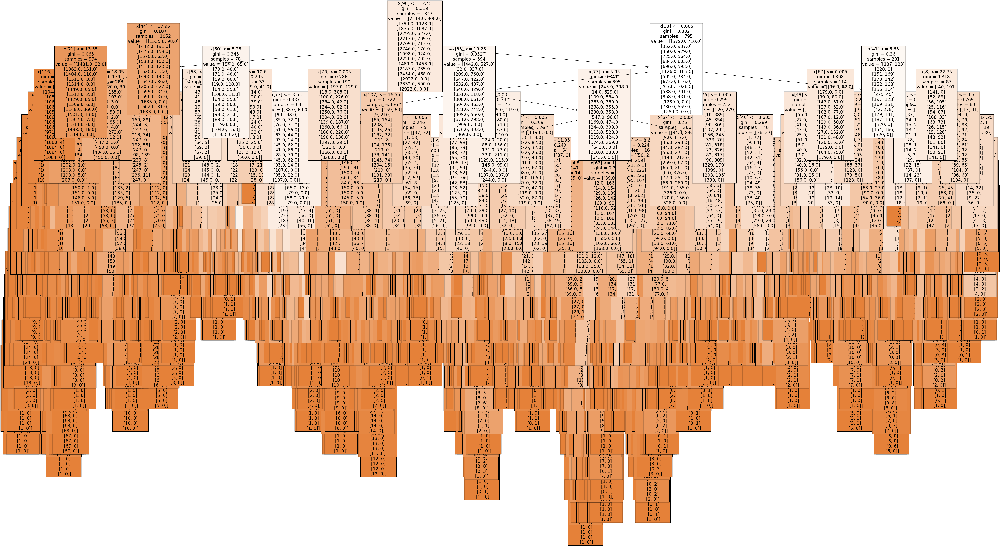

In [24]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [25]:
fig.savefig(f"{r'E:\Careerfoundry course\Careerfoundry Course Old\Machine Learning with Python\Visualizations'}/decision_tree.png")

[Text(0.342379971913703, 0.975, 'x[6] <= 12.25\ngini = 0.318\nsamples = 1863\nvalue = [[2116, 806]\n[1804, 1118]\n[1856, 1066]\n[2281, 641]\n[2233, 689]\n[2213, 709]\n[2740, 182]\n[2057, 865]\n[2220, 702]\n[1540, 1382]\n[2204, 718]\n[2459, 463]\n[2922, 0]\n[2330, 592]\n[2922, 0]]'),
 Text(0.0933381149869333, 0.925, 'x[87] <= 12.25\ngini = 0.077\nsamples = 987\nvalue = [[1509.0, 48.0]\n[1378.0, 179.0]\n[1427.0, 130.0]\n[1528.0, 29.0]\n[1506.0, 51.0]\n[1488.0, 69.0]\n[1555.0, 2.0]\n[1474.0, 83.0]\n[1519.0, 38.0]\n[1255.0, 302.0]\n[1518.0, 39.0]\n[1542.0, 15.0]\n[1557.0, 0.0]\n[1542.0, 15.0]\n[1557.0, 0.0]]'),
 Text(0.043517782070219294, 0.875, 'x[98] <= 17.85\ngini = 0.029\nsamples = 712\nvalue = [[1118.0, 15.0]\n[1049.0, 84.0]\n[1088.0, 45.0]\n[1124.0, 9.0]\n[1112.0, 21.0]\n[1121.0, 12.0]\n[1132.0, 1.0]\n[1107.0, 26.0]\n[1121.0, 12.0]\n[1124.0, 9.0]\n[1114.0, 19.0]\n[1130.0, 3.0]\n[1133.0, 0.0]\n[1130.0, 3.0]\n[1133.0, 0.0]]'),
 Text(0.028633109873877967, 0.825, 'x[69] <= 9.85\ngini = 0

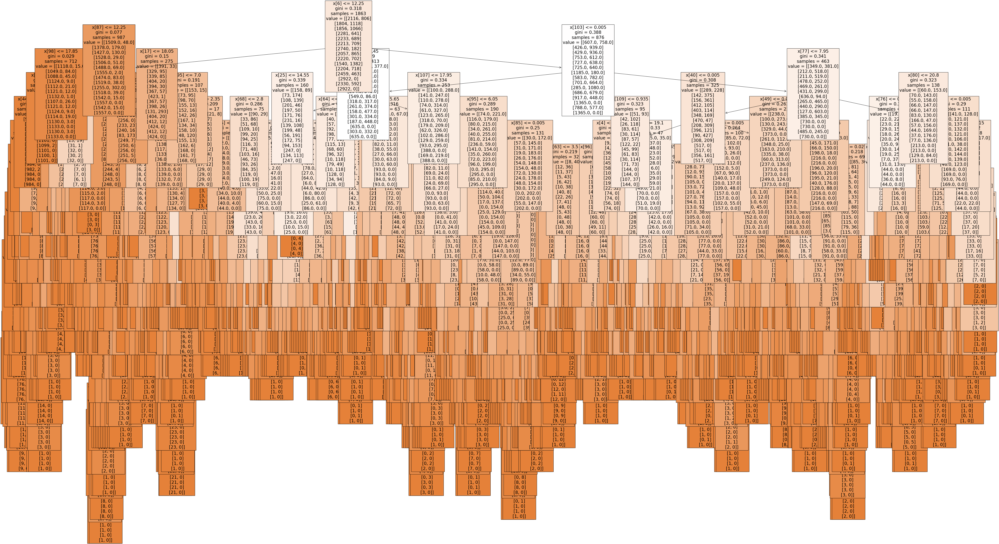

In [26]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[99], fontsize = 20, class_names=pred, filled=True)

In [27]:
fig.savefig(f"{r'E:\Careerfoundry course\Careerfoundry Course Old\Machine Learning with Python\Visualizations'}/decision_tree2.png")

In [28]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([3.42973609e-03, 4.40156552e-03, 3.29029890e-03, 3.15349458e-03,
       1.76796082e-02, 9.46796758e-03, 1.46625168e-02, 5.63149361e-03,
       2.75380612e-02, 4.07822036e-03, 3.21767486e-03, 4.36860120e-03,
       3.07935862e-03, 1.66839746e-02, 3.40157475e-03, 1.11248768e-02,
       7.58334004e-03, 8.95405298e-03, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.18424983e-03, 1.62279604e-02, 1.21792510e-03,
       1.25574027e-02, 1.11398264e-02, 1.84472796e-02, 2.03594973e-03,
       3.10657204e-03, 4.18623064e-03, 5.07475129e-03, 1.52820179e-02,
       6.32403255e-03, 2.41684688e-02, 4.75613125e-03, 2.87764221e-02,
       2.43520219e-03, 3.01669302e-03, 5.21873940e-03, 6.31792334e-03,
       2.31730760e-02, 5.52742298e-03, 1.79856329e-02, 4.88579961e-03,
       3.19444377e-02, 2.41767681e-03, 4.25044926e-03, 4.20258011e-03,
       4.36445720e-03, 1.06248929e-02, 4.49430039e-03, 1.62221934e-02,
       2.95541064e-03, 1.17060111e-02, 2.27032369e-03, 2.13130390e-03,
      

In [29]:
np.set_printoptions(threshold=1000)

In [30]:
newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[3.42973609e-03, 4.40156552e-03, 3.29029890e-03, 3.15349458e-03,
         1.76796082e-02, 9.46796758e-03, 1.46625168e-02, 5.63149361e-03,
         2.75380612e-02],
        [4.07822036e-03, 3.21767486e-03, 4.36860120e-03, 3.07935862e-03,
         1.66839746e-02, 3.40157475e-03, 1.11248768e-02, 7.58334004e-03,
         8.95405298e-03],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.18424983e-03,
         1.62279604e-02, 1.21792510e-03, 1.25574027e-02, 1.11398264e-02,
         1.84472796e-02],
        [2.03594973e-03, 3.10657204e-03, 4.18623064e-03, 5.07475129e-03,
         1.52820179e-02, 6.32403255e-03, 2.41684688e-02, 4.75613125e-03,
         2.87764221e-02],
        [2.43520219e-03, 3.01669302e-03, 5.21873940e-03, 6.31792334e-03,
         2.31730760e-02, 5.52742298e-03, 1.79856329e-02, 4.88579961e-03,
         3.19444377e-02],
        [2.41767681e-03, 4.25044926e-03, 4.20258011e-03, 4.36445720e-03,
         1.06248929e-02, 4.49430039e-03, 1.62221934e-02, 2.95541064

In [31]:
sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.08925474, 0.06249167, 0.06077464, 0.09371058, 0.10050493,
       0.06123797, 0.02160748, 0.09093615, 0.11461712, 0.07328865,
       0.08804539, 0.05423465, 0.03428189, 0.05241298, 0.00260115])

In [56]:
climate_date.columns.tolist()

['DATE',
 'BASEL_cloud_cover',
 'BASEL_humidity',
 'BASEL_pressure',
 'BASEL_global_radiation',
 'BASEL_precipitation',
 'BASEL_sunshine',
 'BASEL_temp_mean',
 'BASEL_temp_min',
 'BASEL_temp_max',
 'BELGRADE_cloud_cover',
 'BELGRADE_humidity',
 'BELGRADE_pressure',
 'BELGRADE_global_radiation',
 'BELGRADE_precipitation',
 'BELGRADE_sunshine',
 'BELGRADE_temp_mean',
 'BELGRADE_temp_min',
 'BELGRADE_temp_max',
 'BUDAPEST_cloud_cover',
 'BUDAPEST_humidity',
 'BUDAPEST_pressure',
 'BUDAPEST_global_radiation',
 'BUDAPEST_precipitation',
 'BUDAPEST_sunshine',
 'BUDAPEST_temp_mean',
 'BUDAPEST_temp_min',
 'BUDAPEST_temp_max',
 'DEBILT_cloud_cover',
 'DEBILT_humidity',
 'DEBILT_pressure',
 'DEBILT_global_radiation',
 'DEBILT_precipitation',
 'DEBILT_sunshine',
 'DEBILT_temp_mean',
 'DEBILT_temp_min',
 'DEBILT_temp_max',
 'DUSSELDORF_cloud_cover',
 'DUSSELDORF_humidity',
 'DUSSELDORF_pressure',
 'DUSSELDORF_global_radiation',
 'DUSSELDORF_precipitation',
 'DUSSELDORF_sunshine',
 'DUSSELDORF_tem

In [57]:
variables = [
    'Basel',
    'Belgrade',
    'Budapest',
    'Debilt',
    'Dusseldorf',
    'Heathrow',
    'Kassel',
    'Ljubljana',
    'Maastricht',
    'Madrid',
    'Munchenb',
    'Oslo',
    'Sonnblick',
    'Stockholm',
    'Valentia'
]

In [58]:
important = pd.Series(sumarray, index = variables) #.sort_values(ascending = False)
important

Basel         0.089255
Belgrade      0.062492
Budapest      0.060775
Debilt        0.093711
Dusseldorf    0.100505
Heathrow      0.061238
Kassel        0.021607
Ljubljana     0.090936
Maastricht    0.114617
Madrid        0.073289
Munchenb      0.088045
Oslo          0.054235
Sonnblick     0.034282
Stockholm     0.052413
Valentia      0.002601
dtype: float64

['Basel', 'Belgrade', 'Budapest', 'Debilt', 'Dusseldorf', 'Heathrow', 'Kassel', 'Ljubljana', 'Maastricht', 'Madrid', 'Munchenb', 'Oslo', 'Sonnblick', 'Stockholm', 'Valentia']


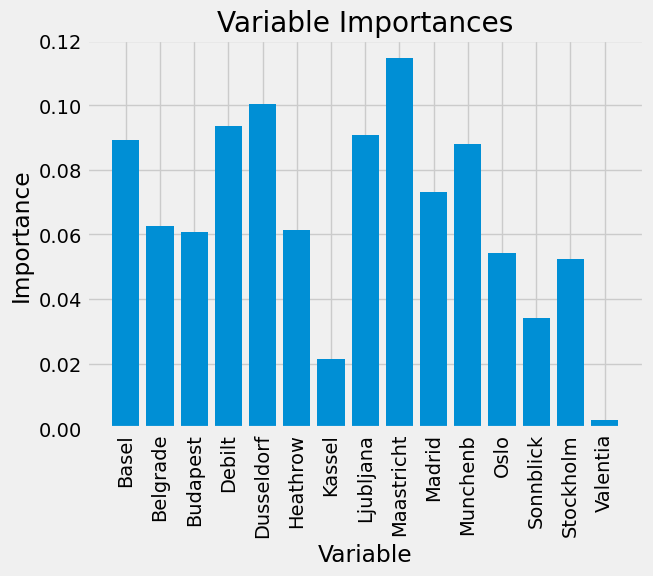

In [59]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

### Maastricht

In [60]:
climate_Maastricht = climate_date[['MAASTRICHT_cloud_cover','MAASTRICHT_humidity','MAASTRICHT_pressure','MAASTRICHT_global_radiation','MAASTRICHT_precipitation','MAASTRICHT_sunshine','MAASTRICHT_temp_mean','MAASTRICHT_temp_min','MAASTRICHT_temp_max']]
climate_Maastricht

,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max
0,7,0.83,1.0063,0.22,0.32,1.0,9.5,8.5,11.1
1,8,0.92,1.0062,0.17,1.34,0.4,8.6,7.5,9.9
2,7,0.97,1.0167,0.12,0.46,0.0,6.9,5.5,9.9
3,7,0.89,1.0277,0.16,0.00,0.3,7.0,3.0,10.0
4,7,0.92,1.0259,0.12,0.56,0.0,8.1,2.5,11.1
...,...,...,...,...,...,...,...,...,...
22945,8,0.67,1.0201,1.17,0.20,5.3,18.6,14.1,22.6
22946,7,0.70,1.0190,1.17,0.20,5.0,18.9,15.8,23.5
22947,8,0.69,1.0183,1.17,0.20,3.2,18.2,13.7,24.3
22948,8,0.73,1.0181,1.17,0.20,6.8,16.3,12.8,21.4


In [61]:
weather_Maastricht = df_Weather[['MAASTRICHT_pleasant_weather']]
weather_Maastricht

,MAASTRICHT_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [62]:
X = climate_Maastricht
y = weather_Maastricht
X

,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max
0,7,0.83,1.0063,0.22,0.32,1.0,9.5,8.5,11.1
1,8,0.92,1.0062,0.17,1.34,0.4,8.6,7.5,9.9
2,7,0.97,1.0167,0.12,0.46,0.0,6.9,5.5,9.9
3,7,0.89,1.0277,0.16,0.00,0.3,7.0,3.0,10.0
4,7,0.92,1.0259,0.12,0.56,0.0,8.1,2.5,11.1
...,...,...,...,...,...,...,...,...,...
22945,8,0.67,1.0201,1.17,0.20,5.3,18.6,14.1,22.6
22946,7,0.70,1.0190,1.17,0.20,5.0,18.9,15.8,23.5
22947,8,0.69,1.0183,1.17,0.20,3.2,18.2,13.7,24.3
22948,8,0.73,1.0181,1.17,0.20,6.8,16.3,12.8,21.4


In [63]:
print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [64]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [65]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 9) (18360, 1)
(4590, 9) (4590, 1)


In [66]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100) #, max_depth=20)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

E:\Anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [67]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


In [68]:
pred = ['Bad weather','Good weather']

[Text(0.7828125, 0.9583333333333334, 'x[3] <= 1.905\ngini = 0.332\nsamples = 11619\nvalue = [14500, 3860]\nclass = Bad weather'),
 Text(0.6019886363636363, 0.875, 'x[7] <= 8.65\ngini = 0.144\nsamples = 8978\nvalue = [13050, 1103]\nclass = Bad weather'),
 Text(0.33125, 0.7916666666666666, 'x[6] <= 12.65\ngini = 0.043\nsamples = 6334\nvalue = [9813.0, 222.0]\nclass = Bad weather'),
 Text(0.11704545454545455, 0.7083333333333334, 'x[6] <= 10.95\ngini = 0.015\nsamples = 6164\nvalue = [9700, 75]\nclass = Bad weather'),
 Text(0.03636363636363636, 0.625, 'x[8] <= 18.0\ngini = 0.001\nsamples = 5735\nvalue = [9080, 6]\nclass = Bad weather'),
 Text(0.01818181818181818, 0.5416666666666666, 'gini = 0.0\nsamples = 5729\nvalue = [9079, 0]\nclass = Bad weather'),
 Text(0.05454545454545454, 0.5416666666666666, 'x[2] <= 1.027\ngini = 0.245\nsamples = 6\nvalue = [1, 6]\nclass = Good weather'),
 Text(0.03636363636363636, 0.4583333333333333, 'gini = 0.0\nsamples = 5\nvalue = [0, 6]\nclass = Good weather'),

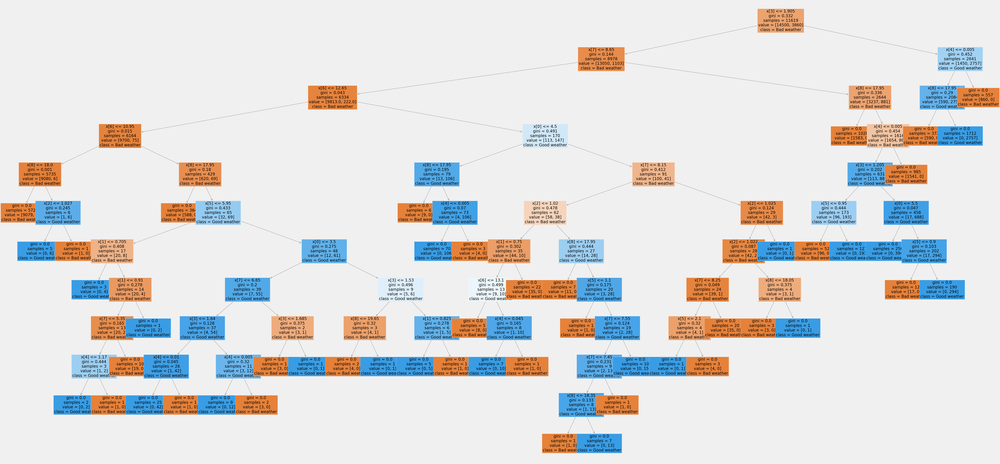

In [69]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [70]:
fig.savefig(f"{r'E:\Careerfoundry course\Careerfoundry Course Old\Machine Learning with Python\Visualizations'}/decision_tree_Maastricht.png")

In [71]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.03624763, 0.02356593, 0.01097498, 0.08610308, 0.31925428,
       0.07934667, 0.13702349, 0.02142493, 0.286059  ])

In [72]:
np.set_printoptions(threshold=1000)

In [73]:
variables = [
    'Cloud cover',
    'Humidity',
    'Pressure',
    'Global ratiation',
    'Precipitation',
    'Sunshine',
    'Temp mean',
    'Temp min',
    'Temp max'
]

In [74]:
important = pd.Series(newarray, index = variables) #.sort_values(ascending = False)
important

Cloud cover         0.036248
Humidity            0.023566
Pressure            0.010975
Global ratiation    0.086103
Precipitation       0.319254
Sunshine            0.079347
Temp mean           0.137023
Temp min            0.021425
Temp max            0.286059
dtype: float64

['Cloud cover', 'Humidity', 'Pressure', 'Global ratiation', 'Precipitation', 'Sunshine', 'Temp mean', 'Temp min', 'Temp max']


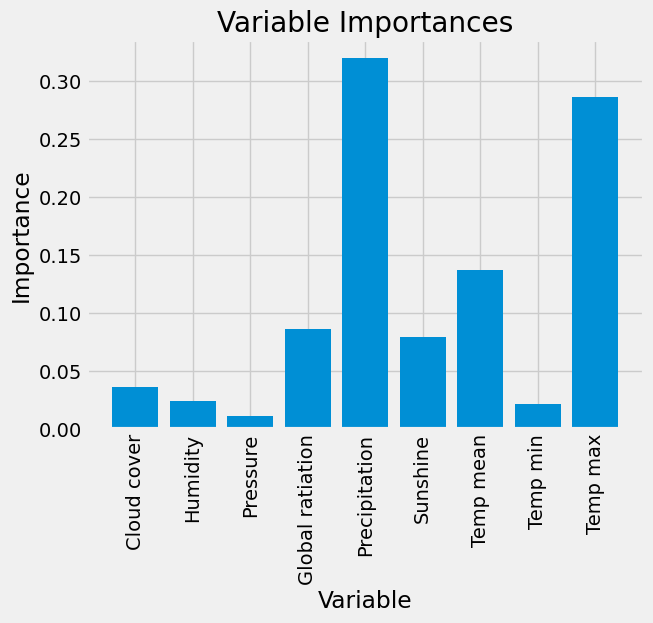

In [75]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

### Dusseldorf

In [76]:
climate_Dusseldorf = climate_date[['DUSSELDORF_cloud_cover','DUSSELDORF_humidity','DUSSELDORF_pressure','DUSSELDORF_global_radiation','DUSSELDORF_precipitation','DUSSELDORF_sunshine','DUSSELDORF_temp_mean','DUSSELDORF_temp_min','DUSSELDORF_temp_max']]
climate_Dusseldorf

,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max
0,8,0.83,1.0161,0.12,0.08,0.0,10.0,7.0,11.5
1,8,0.89,1.0161,0.18,0.66,0.5,8.2,7.4,11.0
2,7,0.95,1.0161,0.12,0.07,0.0,7.1,6.9,9.1
3,8,0.86,1.0161,0.12,0.02,0.0,6.8,3.6,8.0
4,7,0.92,1.0161,0.12,0.62,0.0,7.7,6.2,11.0
...,...,...,...,...,...,...,...,...,...
22945,8,0.75,1.0214,1.13,0.20,6.4,17.8,13.6,21.4
22946,7,0.71,1.0186,1.13,0.20,4.9,19.4,15.4,23.9
22947,8,0.73,1.0196,1.13,0.20,4.0,18.2,13.4,22.0
22948,7,0.73,1.0176,1.13,0.20,6.9,16.7,11.9,21.1


In [77]:
weather_Dusseldorf = df_Weather[['DUSSELDORF_pleasant_weather']]
weather_Dusseldorf

,DUSSELDORF_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [78]:
X = climate_Dusseldorf
y = weather_Dusseldorf
X

,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max
0,8,0.83,1.0161,0.12,0.08,0.0,10.0,7.0,11.5
1,8,0.89,1.0161,0.18,0.66,0.5,8.2,7.4,11.0
2,7,0.95,1.0161,0.12,0.07,0.0,7.1,6.9,9.1
3,8,0.86,1.0161,0.12,0.02,0.0,6.8,3.6,8.0
4,7,0.92,1.0161,0.12,0.62,0.0,7.7,6.2,11.0
...,...,...,...,...,...,...,...,...,...
22945,8,0.75,1.0214,1.13,0.20,6.4,17.8,13.6,21.4
22946,7,0.71,1.0186,1.13,0.20,4.9,19.4,15.4,23.9
22947,8,0.73,1.0196,1.13,0.20,4.0,18.2,13.4,22.0
22948,7,0.73,1.0176,1.13,0.20,6.9,16.7,11.9,21.1


In [79]:
print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [80]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [81]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 9) (18360, 1)
(4590, 9) (4590, 1)


In [82]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100) #, max_depth=20)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

E:\Anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [83]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


[Text(0.4017857142857143, 0.9375, 'x[8] <= 17.95\ngini = 0.341\nsamples = 11637\nvalue = [14363.0, 3997.0]\nclass = Bad weather'),
 Text(0.33035714285714285, 0.8125, 'gini = 0.0\nsamples = 7306\nvalue = [11512, 0]\nclass = Bad weather'),
 Text(0.4732142857142857, 0.8125, 'x[4] <= 0.005\ngini = 0.486\nsamples = 4331\nvalue = [2851, 3997]\nclass = Good weather'),
 Text(0.4017857142857143, 0.6875, 'x[0] <= 6.5\ngini = 0.071\nsamples = 2593\nvalue = [153, 3997]\nclass = Good weather'),
 Text(0.17857142857142858, 0.5625, 'x[5] <= 0.95\ngini = 0.029\nsamples = 2386\nvalue = [56, 3765]\nclass = Good weather'),
 Text(0.10714285714285714, 0.4375, 'gini = 0.0\nsamples = 37\nvalue = [56, 0]\nclass = Bad weather'),
 Text(0.25, 0.4375, 'gini = 0.0\nsamples = 2349\nvalue = [0, 3765]\nclass = Good weather'),
 Text(0.625, 0.5625, 'x[3] <= 1.015\ngini = 0.416\nsamples = 207\nvalue = [97, 232]\nclass = Good weather'),
 Text(0.39285714285714285, 0.4375, 'x[1] <= 0.725\ngini = 0.337\nsamples = 73\nvalue =

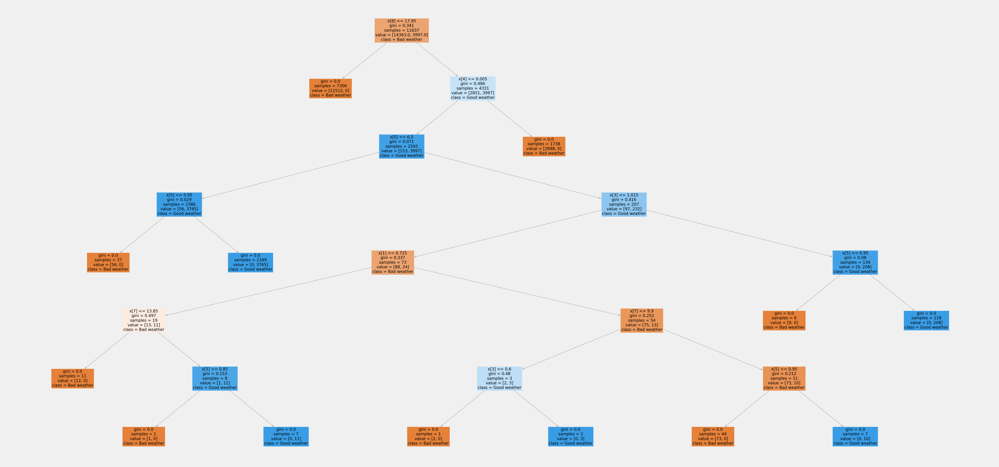

In [84]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [86]:
fig.savefig(f"{r'E:\Careerfoundry course\Careerfoundry Course Old\Machine Learning with Python\Visualizations'}/decision_tree_Dusseldorf.png")

In [87]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.0354964 , 0.01706735, 0.01334239, 0.09031715, 0.34572146,
       0.09699851, 0.14317202, 0.01630582, 0.24157891])

In [88]:
np.set_printoptions(threshold=1000)

In [89]:
important = pd.Series(newarray, index = variables) #.sort_values(ascending = False)
important

Cloud cover         0.035496
Humidity            0.017067
Pressure            0.013342
Global ratiation    0.090317
Precipitation       0.345721
Sunshine            0.096999
Temp mean           0.143172
Temp min            0.016306
Temp max            0.241579
dtype: float64

['Cloud cover', 'Humidity', 'Pressure', 'Global ratiation', 'Precipitation', 'Sunshine', 'Temp mean', 'Temp min', 'Temp max']


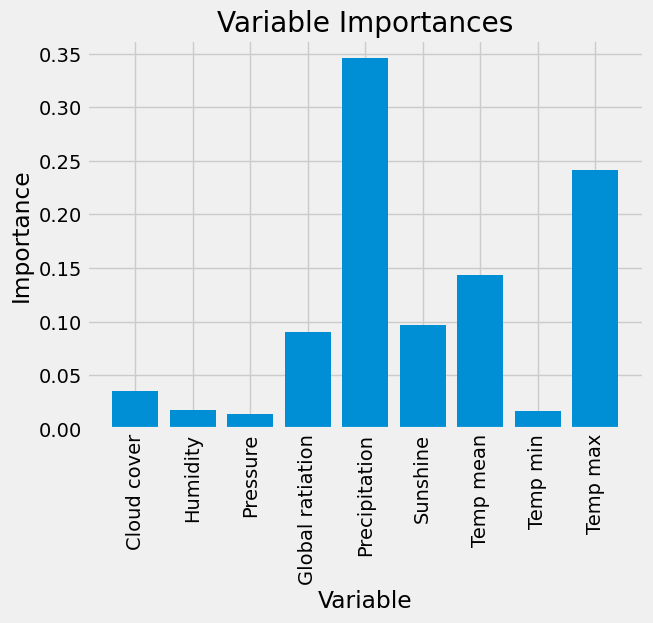

In [90]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances'); 

### Debilt

In [92]:
climate_Debilt = climate_date[['DEBILT_cloud_cover','DEBILT_humidity','DEBILT_pressure','DEBILT_global_radiation','DEBILT_precipitation','DEBILT_sunshine','DEBILT_temp_mean','DEBILT_temp_min','DEBILT_temp_max']]
climate_Debilt 

,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max
0,7,0.85,1.0032,0.07,0.25,0.0,9.3,7.4,11.0
1,8,0.90,1.0056,0.14,0.06,0.1,7.7,6.4,8.3
2,6,0.92,1.0165,0.28,0.01,3.0,6.8,4.6,9.9
3,8,0.95,1.0265,0.08,0.09,0.0,6.7,3.6,10.1
4,6,0.90,1.0243,0.04,0.39,0.0,8.0,2.4,11.2
...,...,...,...,...,...,...,...,...,...
22945,8,0.84,1.0190,1.13,0.22,2.8,15.7,12.8,19.4
22946,8,0.84,1.0177,1.13,0.22,3.5,16.0,10.3,20.5
22947,8,0.86,1.0174,1.13,0.22,3.3,15.8,9.3,21.1
22948,8,0.87,1.0174,1.13,0.22,6.0,14.4,10.3,20.2


In [93]:
weather_Debilt = df_Weather[['DEBILT_pleasant_weather']]
weather_Debilt

,DEBILT_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [95]:
X = climate_Debilt
y = weather_Debilt
X

,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max
0,7,0.85,1.0032,0.07,0.25,0.0,9.3,7.4,11.0
1,8,0.90,1.0056,0.14,0.06,0.1,7.7,6.4,8.3
2,6,0.92,1.0165,0.28,0.01,3.0,6.8,4.6,9.9
3,8,0.95,1.0265,0.08,0.09,0.0,6.7,3.6,10.1
4,6,0.90,1.0243,0.04,0.39,0.0,8.0,2.4,11.2
...,...,...,...,...,...,...,...,...,...
22945,8,0.84,1.0190,1.13,0.22,2.8,15.7,12.8,19.4
22946,8,0.84,1.0177,1.13,0.22,3.5,16.0,10.3,20.5
22947,8,0.86,1.0174,1.13,0.22,3.3,15.8,9.3,21.1
22948,8,0.87,1.0174,1.13,0.22,6.0,14.4,10.3,20.2


In [96]:
print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [97]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [98]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 9) (18360, 1)
(4590, 9) (4590, 1)


In [99]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100) #, max_depth=20)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

E:\Anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [100]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


[Text(0.7360294117647059, 0.9545454545454546, 'x[4] <= 0.005\ngini = 0.323\nsamples = 11668\nvalue = [14635, 3725]\nclass = Bad weather'),
 Text(0.7125, 0.8636363636363636, 'x[3] <= 1.285\ngini = 0.488\nsamples = 5564\nvalue = [5086, 3725]\nclass = Bad weather'),
 Text(0.5191176470588236, 0.7727272727272727, 'x[7] <= 9.05\ngini = 0.151\nsamples = 2600\nvalue = [3757, 338]\nclass = Bad weather'),
 Text(0.3176470588235294, 0.6818181818181818, 'x[0] <= 6.5\ngini = 0.043\nsamples = 2224\nvalue = [3442, 77]\nclass = Bad weather'),
 Text(0.18823529411764706, 0.5909090909090909, 'x[7] <= 6.85\ngini = 0.062\nsamples = 1398\nvalue = [2163, 71]\nclass = Bad weather'),
 Text(0.09411764705882353, 0.5, 'x[7] <= 5.35\ngini = 0.021\nsamples = 1286\nvalue = [2048, 22]\nclass = Bad weather'),
 Text(0.047058823529411764, 0.4090909090909091, 'x[8] <= 18.6\ngini = 0.008\nsamples = 1192\nvalue = [1906, 8]\nclass = Bad weather'),
 Text(0.023529411764705882, 0.3181818181818182, 'gini = 0.0\nsamples = 1188\nv

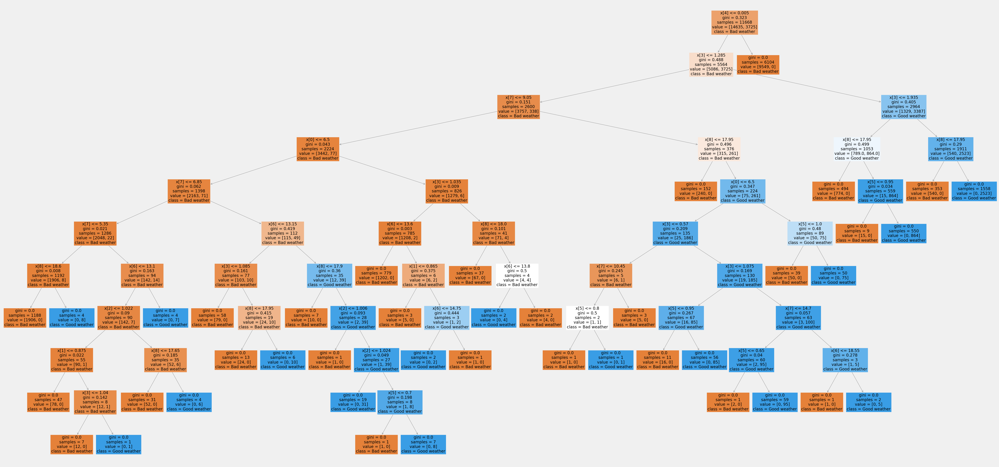

In [101]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, class_names=pred, filled=True)

In [102]:
fig.savefig(f"{r'E:\Careerfoundry course\Careerfoundry Course Old\Machine Learning with Python\Visualizations'}/decision_tree_Debilt.png")

In [103]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.02136372, 0.01529945, 0.01255859, 0.11023704, 0.3194523 ,
       0.07657052, 0.15034727, 0.02758046, 0.26659064])

In [104]:
np.set_printoptions(threshold=1000)

In [105]:
important = pd.Series(newarray, index = variables) #.sort_values(ascending = False)
important

Cloud cover         0.021364
Humidity            0.015299
Pressure            0.012559
Global ratiation    0.110237
Precipitation       0.319452
Sunshine            0.076571
Temp mean           0.150347
Temp min            0.027580
Temp max            0.266591
dtype: float64

['Cloud cover', 'Humidity', 'Pressure', 'Global ratiation', 'Precipitation', 'Sunshine', 'Temp mean', 'Temp min', 'Temp max']


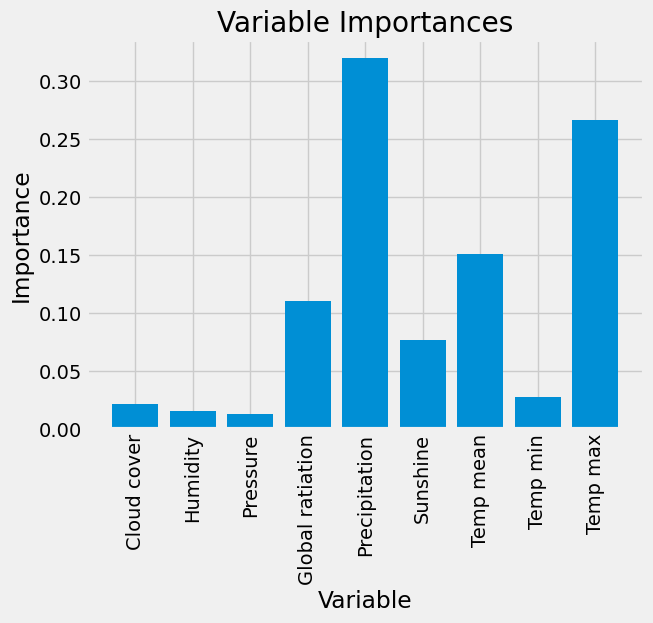

In [106]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(variables)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, variables, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances'); 